## **<center>Spam comment filter using Naive Bayes Classifier**



In this notebook, I will be creating a spam filter using multinomial naive bayes algorithm without sci-kit learn, to filter out spam comments from Youtube videos.
We have data of labelled youtube comments in five seperate files. So we'll train our model with four of them and use the fifth file for prediction and testing for accuracy.
The data set used in this notebook can be found [here](https://www.kaggle.com/prashant111/youtube-spam-collection)

In [2]:
all_files=["Youtube01-Psy.csv","Youtube02-KatyPerry.csv","Youtube03-LMFAO.csv","Youtube04-Eminem.csv"]

In [3]:
list_=[]
import pandas as pd
for file_ in all_files:
    frame = pd.read_csv(file_)
    list_.append(frame)

# concatenate all dfs into one
df = pd.concat(list_, ignore_index=True)

In [4]:
df

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^ ﻿,1
4,z13fwbwp1oujthgqj04chlngpvzmtt3r3dw,GsMega,2013-11-10T16:05:38,watch?v=vtaRGgvGtWQ Check this out .﻿,1
...,...,...,...,...,...
1581,LneaDw26bFu3RCmyrWyP9S6wh1h9dBv3X95g1HzKAb4,Dany PK,NaN,SUBSCRIBE TO MY CHANNEL X PLEASE!. SPARE,1
1582,LneaDw26bFsD65dtIvAEObWYIYnFTqQDKBek_Ypz3J8,SmexyFriedChicken,NaN,Check out my videos guy! :) Hope you guys had ...,1
1583,LneaDw26bFuvs-8oWkLpAFa6g3QHpWD8k7sbbMP3Bg8,The Guy That's Done Everything,NaN,3 yrs ago I had a health scare but thankfully ...,1
1584,z12hfp2wmyuqztkw504cgblyxtbsxjuzeow0k,Jesse Pinkman,2015-05-06T11:42:44.601000,Rihanna looks so beautiful with red hair ;)﻿,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1586 entries, 0 to 1585
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   COMMENT_ID  1586 non-null   object
 1   AUTHOR      1586 non-null   object
 2   DATE        1341 non-null   object
 3   CONTENT     1586 non-null   object
 4   CLASS       1586 non-null   int64 
dtypes: int64(1), object(4)
memory usage: 62.1+ KB


# Data Cleaning

Since, our aim is to classify comments as spam or not spam, we can drop the first three columns of the dataframe. Upon inspection of data, we can see that there are few tags, links and parsing errors that we need to clean up before we can create our classification model.

In [6]:
df.drop(columns=["COMMENT_ID","AUTHOR","DATE"],inplace=True)

In [7]:
df["CONTENT"][700]

'<a href="http://www.youtube.com/watch?v=KQ6zr6kCPj8&amp;t=2m19s">2:19</a> best part\ufeff'

In [8]:
import html
df["CONTENT"]=df["CONTENT"].apply(html.unescape)
df["CONTENT"]=df["CONTENT"].str.replace("\ufeff","")

In [9]:
df["CONTENT"][700]

'<a href="http://www.youtube.com/watch?v=KQ6zr6kCPj8&t=2m19s">2:19</a> best part'

To improve efficiency of our model, let's replace all link
tags with a common word so that our algorithm treats all links as a single feature in our classification. Since all a-tags will have hyperlinks, lets replace them with a single word "htmllink".

In [10]:
df["CONTENT"]=df["CONTENT"].str.replace("(<a.+>)","htmllink")

Now lets inspect all other tags and remove them as they are not relevant to our analysis.

In [11]:
df[df["CONTENT"].str.contains("<.+>")]["CONTENT"]

381     <script>document.write('<a target="_self" href...
700     <a href="http://www.youtube.com/watch?v=KQ6zr6...
702     Hey guys, I'm a human.<br /><br /><br />But I ...
708                                          Awsome<br />
728                             Super awesome video<br />
                              ...                        
1409                EMINEM<3 <br />the best rapper ever<3
1464    <a rel="nofollow" class="ot-hashtag" href="htt...
1499    If you are a person that loves real music you ...
1546               Love your songs<br />Supper cool<br />
1566     Really good song .<br />you know love song song.
Name: CONTENT, Length: 80, dtype: object

In [12]:



df["CONTENT"]=df["CONTENT"].str.replace("<.+>","")

In [13]:
df["CONTENT"]=df["CONTENT"].str.replace("\'","")

In [14]:
df["CONTENT"]=df["CONTENT"].str.lower()

In [15]:
df[df["CONTENT"].str.contains("\.com|watch\?")]

<>:1: SyntaxWarning: invalid escape sequence '\.'
<>:1: SyntaxWarning: invalid escape sequence '\.'
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\3004819090.py:1: SyntaxWarning: invalid escape sequence '\.'
  df[df["CONTENT"].str.contains("\.com|watch\?")]


,CONTENT,CLASS
2,just for test i have to say murdev.com,1
4,watch?v=vtarggvgtwq check this out .,1
12,https://twitter.com/gbphotographygb,1
14,please like :d https://premium.easypromosapp.c...,1
17,http://www.ebay.com/itm/171183229277?sspagenam...,1
...,...,...
1464,"<a rel=""nofollow"" class=""ot-hashtag"" href=""htt...",1
1476,check out these lyrics /watch?v=yuttx04oyqq,1
1521,hello to everyone! please check out my video: ...,1
1522,/watch?v=aimbwbfqbzg watch and subscrible,1


There are still few rows with links. Let's replace them too with "htmllink" and then remove all non-alpha numerical characters.

In [16]:

df["CONTENT"][1573]

'subscribe to my channel  /watch?v=nxk32i0hkds'

In [17]:
df["CONTENT"]=df["CONTENT"].str.replace(r"\S*\.com\S*|\S*watch\?\S*","htmllink")

In [18]:
df["CONTENT"]=df["CONTENT"].str.replace("\W"," ")

<>:1: SyntaxWarning: invalid escape sequence '\W'
<>:1: SyntaxWarning: invalid escape sequence '\W'
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1751550871.py:1: SyntaxWarning: invalid escape sequence '\W'
  df["CONTENT"]=df["CONTENT"].str.replace("\W"," ")


In [19]:
df["CONTENT"][1573]

'subscribe to my channel  /watch?v=nxk32i0hkds'

In [20]:
df["CONTENT"][14]

'please like :d https://premium.easypromosapp.com/voteme/19924/616375350'

# 2. Model Creation

In [21]:
df["CLASS"].value_counts(normalize=True)

CLASS
1    0.52396
0    0.47604
Name: proportion, dtype: float64

We need to find the two probabilities inorder to find out if a comment is spam or not:

*  Probability that a comment is spam, given the words in the comment
*   Probability that a comment is not spam, given the words in the comment

To find these probabilities, we can use the formula shown below



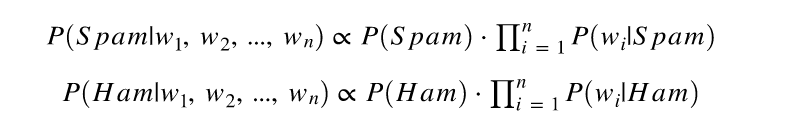

Inorder to calculate the conditional probabilities of words (given its a spam or not), we can use the formula shown below:
* Note that we will be using Laplace smoothing (alpha=1) for sample correction. We are using a correction to avoid a probability value to become zero just because probability of one of the words in the comment is zero (Since we perform multiplication). Check [this](https://medium.com/syncedreview/applying-multinomial-naive-bayes-to-nlp-problems-a-practical-explanation-4f5271768ebf) blog out for a better explaination.

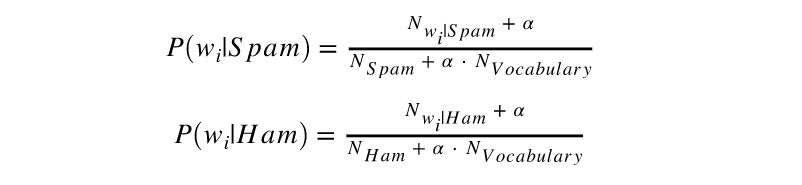

Now let's get the unique words and perform the required calculations

In [22]:
vocab=[]
for comment in df["CONTENT"]:
    for word in comment.split():
        vocab.append(word)

In [23]:
vocabulary=list(set(vocab))
len(vocabulary)

4857

In [24]:
# Create a column for each of the unique word in our vocabulary inorder to get the count of words
for word in vocabulary:
    df[word]=0

C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[word]=0
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[word]=0
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[word]=0
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[word]=0
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\1693788958.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

In [25]:
df.head()

,CONTENT,CLASS,awards,hyuck,worthless,17yr,shit?,headbutt,"href=""",toogit,...,cyrus:,"talent,",bands,sing.,humankind.,alcoholic:,"style”,",support,http://www.twitch.tv/tareko100,helping
0,"huh, anyway check out this you[tube] channel: ...",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,hey guys check out my new channel and our firs...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,just for test i have to say murdev.com,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,me shaking my sexy ass on my channel enjoy ^_^,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,watch?v=vtarggvgtwq check this out .,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [26]:
# looping through data frame and counting words
for index,value in enumerate(df["CONTENT"]):
  for l in value.split():
    df[l][index]+=1

C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\4246925110.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[l][index]+=1
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\4246925110.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[l][index]+=1
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\4246925110.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[l][index]+=1
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\42

In [27]:
df.head()

,CONTENT,CLASS,awards,hyuck,worthless,17yr,shit?,headbutt,"href=""",toogit,...,cyrus:,"talent,",bands,sing.,humankind.,alcoholic:,"style”,",support,http://www.twitch.tv/tareko100,helping
0,"huh, anyway check out this you[tube] channel: ...",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,hey guys check out my new channel and our firs...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,just for test i have to say murdev.com,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,me shaking my sexy ass on my channel enjoy ^_^,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,watch?v=vtarggvgtwq check this out .,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
df["CLASS"] = df["CLASS"].astype(int)

In [29]:
df["CLASS"].value_counts()

CLASS
1    831
0    755
Name: count, dtype: int64

In [30]:
# Assign variables to all values required in calculation
p_ham=0.47604
p_spam=0.52396
n_spam=df[df["CLASS"]==1].drop(columns=["CONTENT","CLASS"]).sum().sum()
n_ham=df[df["CLASS"]==0].drop(columns=["CONTENT","CLASS"]).sum().sum()
n_vocabulary=len(vocabulary)

In [31]:
# Slicing dataframe for each class
df_sspam=df[df["CLASS"]==1]
df_hham=df[df["CLASS"]==0]

Let's create dictionaries to store probabilities of each word in dataframe given its a spam and not spam, so that we can reference values when required

In [32]:
parameters_spam = {unique_word:0 for unique_word in vocabulary}
parameters_ham = {unique_word:0 for unique_word in vocabulary}
for word in vocabulary:
    n_word_given_spam = df_sspam[word].sum()   # spam_messages already defined in a cell above
    p_word_given_spam = (n_word_given_spam + 1) / (n_spam + 1*n_vocabulary)
    parameters_spam[word] = p_word_given_spam
    n_word_given_ham = df_hham[word].sum()   # ham_messages already defined in a cell above
    p_word_given_ham = (n_word_given_ham + 1) / (n_ham + 1*n_vocabulary)
    parameters_ham[word] = p_word_given_ham

# 3. Model Testing

Let's create a function to clean a comment as we did before, calculate probabilities and return the predicted class of that comment

In [64]:
from translate import Translator
from langdetect import detect

def classifier(string):
    message=html.unescape(string)
    message=string.replace("\ufeff","")
    message=string.replace("(<a.+>)","htmllink")
    message=string.replace("\'|<.+>","")
    message=string.replace("\S*\.com\S*|\S*watch\?\S*","htmllink")
    message=string.replace("\W"," ").lower()
    p_string_s=1
    p_string_h=1
    message=translate_to_english(message)

    for word in message.split():
        if word in parameters_spam:
            p_string_s*=parameters_spam[word]
            p_string_h*=parameters_ham[word]
    if (p_string_s*p_spam)>(p_string_h*p_ham):
        return(1)
    elif (p_string_s*p_spam)<(p_string_h*p_ham):
        return(0)
    else:
        return(-1)
    


def translate_to_english(text):
    source_lang = detect(text)
    translator = Translator(to_lang="en", from_lang=source_lang)
    translated_text = translator.translate(text)
    return translated_text


<>:6: SyntaxWarning: invalid escape sequence '\S'
<>:7: SyntaxWarning: invalid escape sequence '\W'
<>:6: SyntaxWarning: invalid escape sequence '\S'
<>:7: SyntaxWarning: invalid escape sequence '\W'
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\3332514141.py:6: SyntaxWarning: invalid escape sequence '\S'
  message=string.replace("\S*\.com\S*|\S*watch\?\S*","htmllink")
C:\Users\akhil\AppData\Local\Temp\ipykernel_18688\3332514141.py:7: SyntaxWarning: invalid escape sequence '\W'
  message=string.replace("\W"," ").lower()


Translated text: one of the best songs I've ever heard


In [34]:
# Reading the dataframe for testing model
df_shakira=pd.read_csv("Youtube05-Shakira.csv")

In [35]:
df_shakira.head()

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS
0,z13lgffb5w3ddx1ul22qy1wxspy5cpkz504,dharma pal,2015-05-29T02:30:18.971000,Nice song﻿,0
1,z123dbgb0mqjfxbtz22ucjc5jvzcv3ykj,Tiza Arellano,2015-05-29T00:14:48.748000,I love song ﻿,0
2,z12quxxp2vutflkxv04cihggzt2azl34pms0k,Prìñçeśś Âliś Łøvê Dømíñø Mâđiś™ ﻿,2015-05-28T21:00:08.607000,I love song ﻿,0
3,z12icv3ysqvlwth2c23eddlykyqut5z1h,Eric Gonzalez,2015-05-28T20:47:12.193000,"860,000,000 lets make it first female to reach...",0
4,z133stly3kete3tly22petvwdpmghrlli,Analena López,2015-05-28T17:08:29.827000,shakira is best for worldcup﻿,0


In [36]:
df_shakira["Pred_Class"]=df_shakira["CONTENT"].apply(classifier)

In [37]:
correct_predictions=0
total_rows=0
for row in df_shakira.iterrows():
    row=row[1]
    total_rows+=1
    if row["CLASS"]==row["Pred_Class"]:
        correct_predictions+=1
accuracy=correct_predictions/total_rows
print("accuracy=",accuracy)


accuracy= 0.845945945945946


## **Conclusion**

Our model classified ~85% of the comments correctly. Considering the simplicity of this algorithm, it is a really useful classification model, which is often used in Natural Language processing (NLP) problems

However, one of the major drawbacks of naive-bayes classifier is that it does not consider the relationship between features.

Let's try to classify some commonly seen comments on YouTube using our model (1 - Spam, 0 - Not Spam)

In [38]:
classifier("This song gives me goosebumps!!")


0

In [39]:
classifier("Please subscribe to my channel as I'm approaching 1M subscribers")

1

In [40]:
classifier("If you want to be a mastercoder, consider buying my course for 50% off at www.buymycourse.com")

1

In [41]:
classifier("i like this song")


0

In [42]:
classifier("https://twitter.com/gbphotographygb")


1

In [43]:
classifier("unlike this video spread hate")


1

In [57]:
classifier("erkngkjren")

1

In [61]:
classifier("one of the best song i have ever heard")

0

In [62]:
classifier("harsha vardhan")

1

In [67]:
classifier("одна из лучших песен, которые я когда-либо слышал")

0

In [76]:
classifier("यह नया वीडियो देखें")

1